# Classifying urabn sounds using transfer learning / *Doron Yablovich*
In this notebook I'll show how I used a pre-trained model to classify audio samples to 10 different categories.

Data from https://urbansounddataset.weebly.com/urbansound8k.html

In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
from IPython.display import Image
from IPython.display import display
from IPython.display import Audio

### Data exploration

First thing is to check how many samples we have per each label (are they balanced?)

Text(0.5, 1.0, 'Label counts')

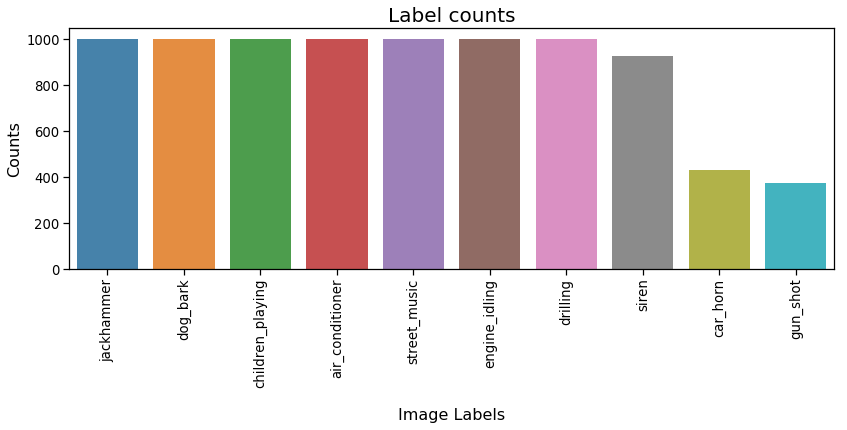

In [2]:
base_dir = r'C:\Users\USER1\Desktop\urban_sound\UrbanSound8K.tar\UrbanSound8K'
matadate_file = os.path.join(base_dir, r'metadata\UrbanSound8K.csv')
metadata = pd.read_csv(matadate_file)
label_counts = metadata['class'].value_counts()
plt.figure(figsize = (12,6))
sns.set_context("notebook", font_scale=1.2)
sns.barplot(label_counts.index, label_counts.values, alpha = 0.9)
plt.xticks(rotation = 'vertical')
plt.xlabel('Image Labels', fontsize =16, labelpad=20)
plt.ylabel('Counts', fontsize = 16)
plt.tight_layout()
plt.title('Label counts', fontsize=20)

We see that for labels "car horn" and "gun shot" there are much fewer samples compared than the rest.
Later we'll check whether it's a problem or not.

Now, let's have a look at the Audio files.

In [3]:
wav_name = []
fold = []
wav_list = []
sr_list = []
audio_list = []
labels = metadata['class'].unique()
for label in labels:
    my_rows = metadata.loc[:,'class'] == label
    wav_name.append(list(metadata.loc[my_rows, 'slice_file_name'][0:3]))
    fold.append(list(metadata.loc[my_rows, 'fold'][0:3]))
wav_name = np.array(wav_name).flatten()
fold = np.array(fold).flatten()
for i in range(len(wav_name)):
    wav_file = os.path.join(base_dir,'audio', 'fold'+str(fold[i]), wav_name[i])
    y, sr = librosa.load(wav_file)
    audio_list.append(y)
    sr_list.append(sr)
    wav_list.append(wav_file)

<Figure size 432x288 with 0 Axes>

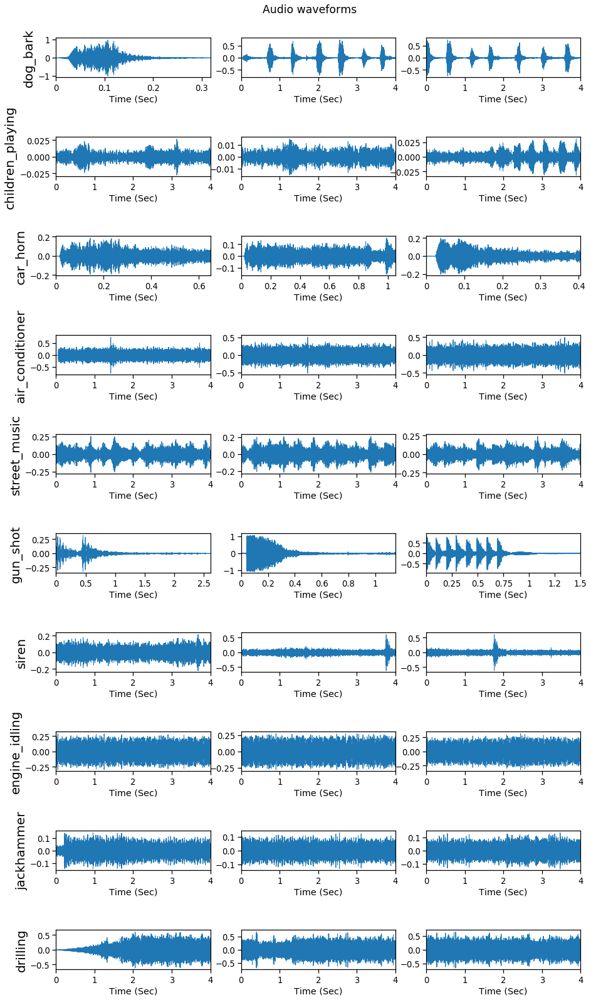

In [4]:
plt.figure()
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(15,25))
fig.subplots_adjust(hspace=1.5, top=0.95)
fig.suptitle('Audio waveforms')
my_label = 0
for i, y, sr in zip(range(0,30), audio_list, sr_list):
    i+=1
    plt.subplot(10, 3, i)
    librosa.display.waveplot(y, sr=sr)
    plt.xlabel('Time (Sec)')
    if i % 3 ==1:
        plt.ylabel(labels[my_label], fontsize=20)
        my_label +=1

We see how different labels have different waveforms. Some labels have very distinct pattern and easy to differentiate from the rest (like "siren" or "dog bark") while for other labels it seems impossible (can you tell is it "drilling" or "air conditioner"?). Notice that even samples of the same label are not always similar (for example, the first "dog bark" plot is not like the two others). 

When it comes to audio, it's obvious that the amplitude itself is not enough.
The frequencies of the sound waves contain a lot of information which we can use.

### Spectrograms
Using short-time Fourier transform (STFT) we can analyze data both in time domain and frequency domain simultaneously.

<Figure size 432x288 with 0 Axes>

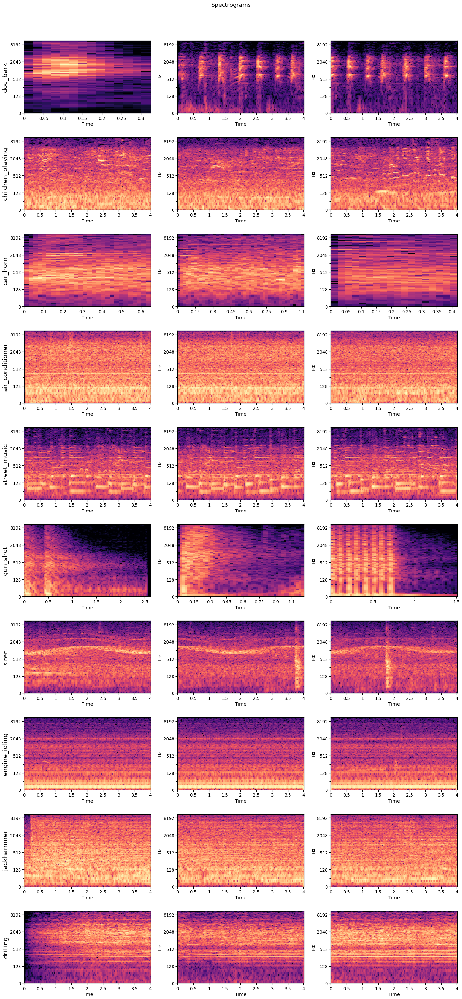

In [5]:
plt.figure()
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(20,45))
fig.subplots_adjust(hspace=1)
fig.suptitle('Spectrograms')
my_label = 0
for i, y, sr in zip(range(0,30), audio_list, sr_list):
    i+=1
    plt.subplot(10, 3, i)
    log_S = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='log')
    locs, y_labels = plt.yticks()
    fewer_locs = locs[::2]
    plt.yticks(fewer_locs)
    if i % 3 ==1:
        plt.ylabel(labels[my_label], fontsize=20)
        my_label +=1
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

### Mel-scale

One commonly used method in audio analysis is to transform the frequencies (Hz) to the Mel scale.
The Mel-scaled is based on human perception experiments which found that human ear can discriminate better at lower frequencies and less at higher frequencies.

<Figure size 432x288 with 0 Axes>

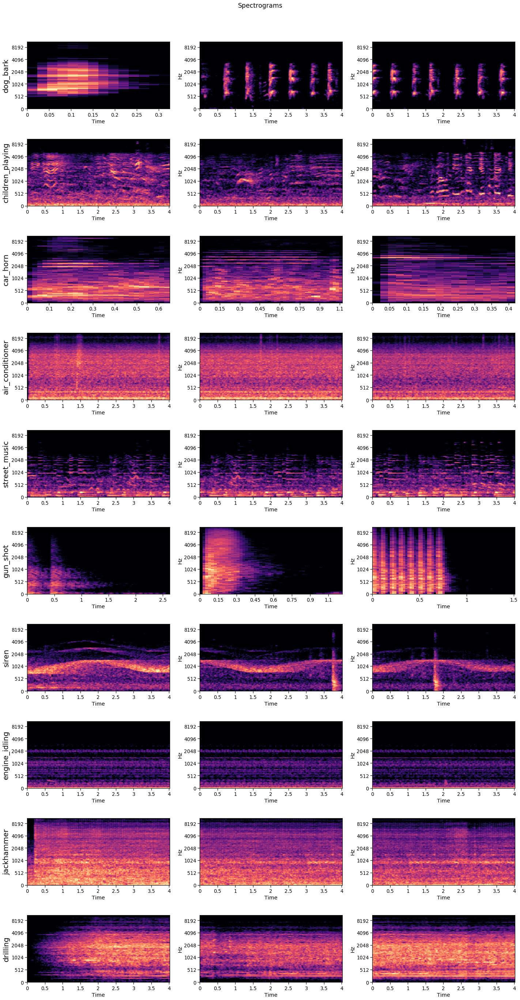

In [6]:
plt.figure()
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(20,40))
fig.subplots_adjust(hspace=1)
fig.suptitle('Spectrograms')
my_label = 0
for i, y, sr in zip(range(0,30), audio_list, sr_list):
    i+=1
    plt.subplot(10, 3, i)
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    log_S = librosa.amplitude_to_db(S, ref=np.max)
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')
    if i % 3 ==1:
        plt.ylabel(labels[my_label], fontsize=20)
        my_label +=1
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

The spectrograms are better visual representations of the signal than the waveforms and the mel-scaled spectrograms are even better. With the mel-scaled spectograms, it's easier to visualize similarity of samples within the same label and the differences between labels.

### Transfer-learning

Now, when we got images we can use a pre-trained neural network that specialized in image classification. Here I used "Inception" which was already trained to classify 1,000 different classes of the "Imagenet" dataset. 

We will only retrain weights of the last layer of the model, just before the softmax layer gives a score for each label.

I split the dataset as follow:
- 80% training
- 10% validation 
- 10% testing

We will optimize the model on the validation set and only at the final step we will use the test set to test the model's performances.

### Validation

We will answer those questions:

1. Which type of spectrograms are better to train the model with? raw or mel-scaled?
2. How many training steps the model needs to generalize well?
3. How can we improve model generalization?
4. What are the optimal values for learning rate and batch size?

### 1. Hertz vs Mel-scale ?

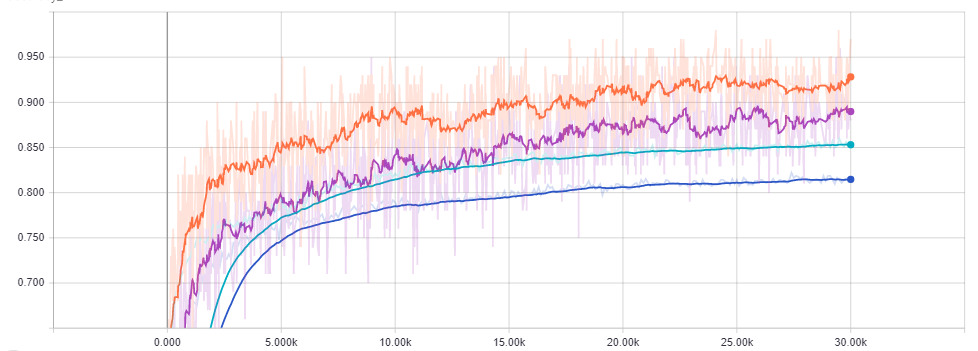

In [19]:
x = Image('raw_vs_mel.PNG')  # Visualizing model performance was done using tensorboard
display(x)

Orange = Training - Mel-scale
<BR>
Purple =  Training - Hertz
<BR>
Cyan =  Validation -  Mel-scale
<BR>
Blue = Validation - Hertz
    
---

Training with mel-scaled spectrograms yields better results than using raw spectrograms. Interestingly, that mel-scaled spectrograms capture more meaningful information than the raw spectrograms even though the mel-scale is aimed to mimic perceptual aspects of the **human** auditory system's. Seems that what works for humans, works for machines as well.

In the next analyses, we'll continue only with the mel-scaled spectrograms.

We see how accuracy goes higher on both training set and validation set until 30K steps.

Does the model stop learning? maybe we need to train longer?

### 2. 100K training steps

#### Accuracy

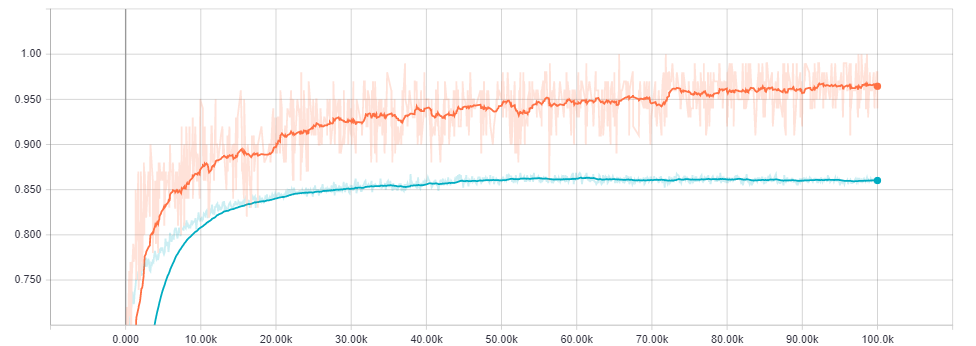

In [8]:
x = Image('100k_acc.PNG') 
display(x)


Orange = Training
<BR>
Cyan = Validation
    
---    
#### Cross-Entropy loss


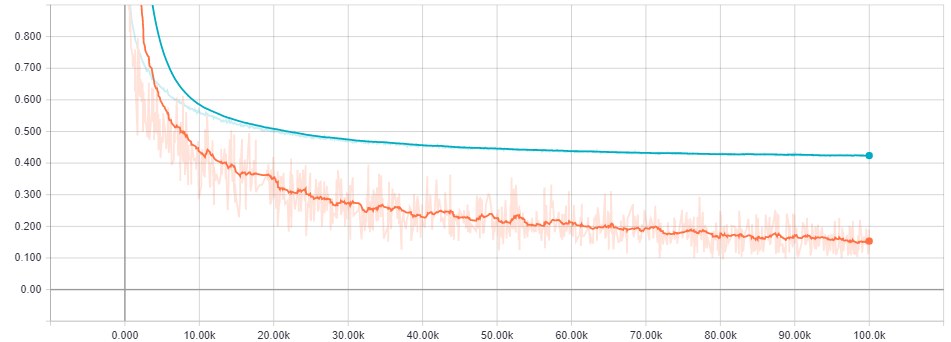

In [9]:
x = Image('100kloss.PNG') 
display(x)

Orange = Training
<BR>
Cyan = Validation
    
---    

The model has quite nice performance regard the fact that most of the training was on completely different images. Still, it doesn't generalize very well. The training loss keeps decreasing while validation loss goes on a plateau around step 50K. The difference between the two is the known "generalization gap" which we want to reduce. Worth mentioning this is not an overfitting issue since the validation loss is not increasing in time.

In the next validation experiments, I'll run the model up to 30K only to save running time, but before the final test, I'll do train the model using 50K steps.

So, what can we do to generalize better?
    
### 3. Data Augmentation
There are several methods to enhance generalization of a model. Some of them (Dropout, Batch normalization, and Regularization) are not relevant in our case since we are working on a pre-trained model and most of the weights are fixed. Here I applied data augmentation during the training to make the model more robust to small changes and hence to perform better on the test set.

Usually, in image classification tasks, data augmentation is applied using rescaling, distortions, rotating, cropping, etc. Those are not appropriate here when the images actually represent audio signals. Instead, we can use another information hidden in the audio files as data augmentation.
At the previous part, loading the audio files was done with default parameters so the two channels of stereo files were averaged together and then were processed to create one spectrogram. Now, each of the channels will be loaded separately and I created three images from one audio file: mono-left, mono-right, and the averaged signal.
    
- I applied this only on files that originally have 2 channels.
- I excluded "fake stereo" files (when both channels are exactly the same).

Overall, we increased our training set by 2.4 (from 8732 images to 20,968 images).

We should check whether the augmentation process changed somehow the distribution over labels.

Text(0.5, 1.0, 'Label counts after augmentation')

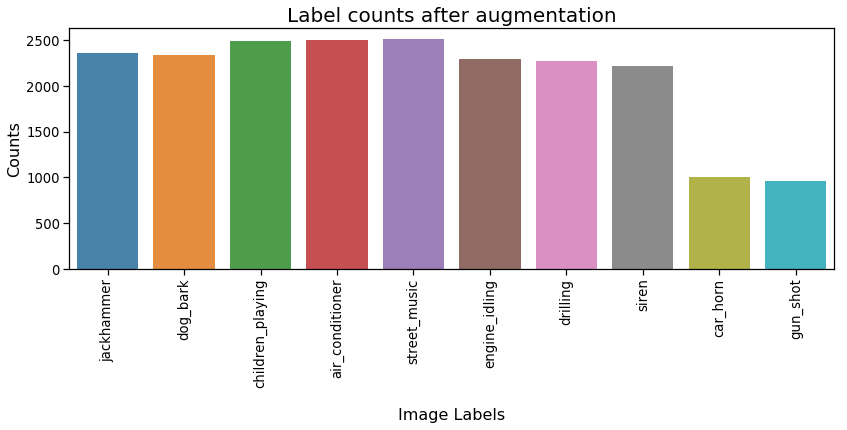

In [10]:
image_dir = r'C:\Users\USER1\Desktop\urban_sound\spectrograms_mel'
import os, os.path
aug_counts = []
for label in label_counts.index:
    sub_path =  os.path.join(image_dir,label) 
    aug_counts.append(len([file for file in os.listdir(sub_path) ]))
plt.figure(figsize = (12,6))
sns.set_context("notebook", font_scale=1.2)
sns.barplot(label_counts.index, aug_counts, alpha = 0.9)
plt.xticks(rotation = 'vertical')
plt.xlabel('Image Labels', fontsize =16, labelpad=20)
plt.ylabel('Counts', fontsize = 16)
plt.tight_layout()
plt.title('Label counts after augmentation', fontsize=20)

The general distribution was kept as before when eight labels are with quite the same counts and two labels ("car horn" and "gun shot") with much fewer samples.

We are going to compare the 2 models, one based on the initial amount of data and the second including the new images after the channel separation process.

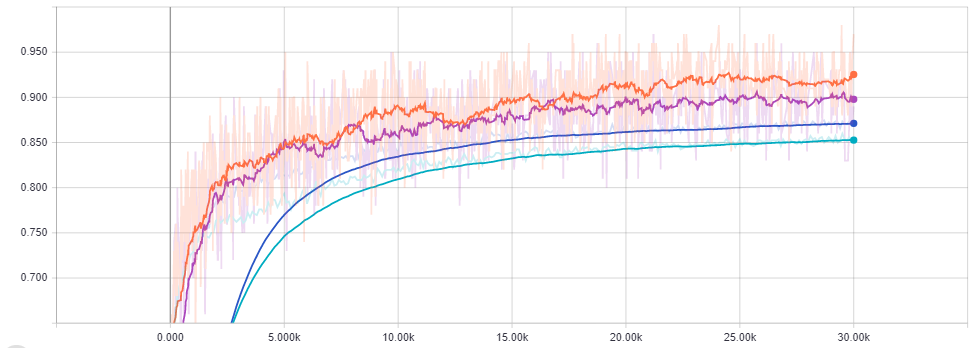

In [11]:
x = Image('aug_vs_basic.PNG') 
display(x)

Orange = Training - original data
<BR>
Purple = Training - augmented data
<BR>
Blue = Validation - augmented data
<BR>
Cyan = Validation -  original data
    
---    

Training with more data led to low accuracy on the training compared to the model with the original amount of data but,  **increased inference on the validation step by 2%** (85% to 87%).


### Optimize hyperparameters

Next, we turn to explore how different values of learning rate and batch size will affect model performance.

Learning rate = [0.005, 0.01, 0.05]

Batch size = [50, 100, 200]

Since there is a known interplay between learning rate and batch size on model performance, I'll test each of their 9 combinations.

I found the best setup is when learning rate = 0.05 and batch size = 200 that gives **accuracy = 91.3 %** on the validation set.

### Results per label

Remember we work with unbalanced data?

Let's have a look at the precision-recall and their harmonic mean (f1-sore) for each label.


In [12]:
pd.read_table('precision recall_validation.txt')

,Label,Precision,Recall,F1-score
0,gun shot,0.974359,0.926829,0.950000
1,air conditioner,0.877551,0.826923,0.851485
2,dog bark,0.907407,0.980000,0.942308
3,children playing,0.941748,0.941748,0.941748
4,jackhammer,0.967033,0.888889,0.926316
5,street music,0.909091,0.841121,0.873786
6,car horn,0.905660,0.960000,0.932039
7,siren,0.975904,0.920455,0.947368
8,drilling,0.870130,0.881579,0.875817
9,engine idling,0.858209,0.982906,0.916335


We can see that although some categories have much fewer samples ("gun shot" and "car horn"), the model managed to learn their patterns better than other categories.

## Testing

Now for the final test, how our model will manage on unseen samples?

# Test Accuracy of **90%** 

Where the model was right and where not? 

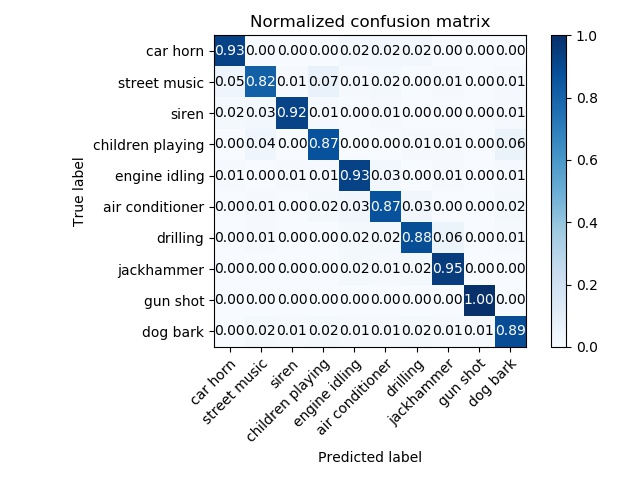

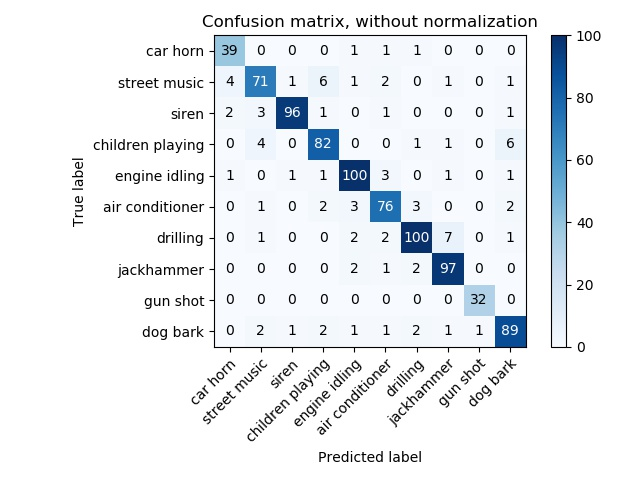

In [13]:
x =  Image('testconfusuon_mat_normalized.jpg')
y = Image('testconfusuon_mat.jpg') 
display(x, y)

We see that "gun shot" has the perfect accuracy (100%), with all 32 samples were correctly classified. On the other hand, "street music" has the lowest score (82%) with 11 false-positive events 16 false-negative. 

Let's inspect some of those misclassified samples by plotting their spectrograms and listening to the audio.

<Figure size 432x288 with 0 Axes>

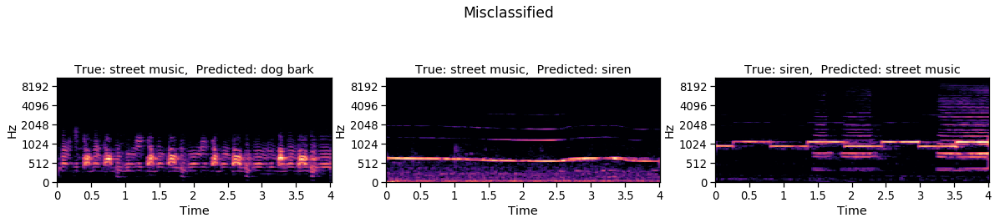

In [14]:
ex1_wav = os.path.join(base_dir, 'audio', 'fold5', '109263-9-0-39.wav')
ex2_wav = os.path.join(base_dir, 'audio', 'fold2', '194841-9-0-48.wav')
ex3_wav = os.path.join(base_dir, 'audio', 'fold7', '105289-8-1-1.wav')
examples_files = [ex1_wav, ex2_wav, ex3_wav]
ex_labels = ['True: street music,  Predicted: dog bark', 
             'True: street music,  Predicted: siren',
             'True: siren,  Predicted: street music']
examples_files
i = 0
plt.figure()
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,40))
fig.subplots_adjust(hspace=1, top=0.95)
fig.suptitle('Misclassified')
for wav_file in examples_files:
    y, sr = librosa.load(wav_file)
    i+=1
    plt.subplot(10, 3, i)
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    log_S = librosa.amplitude_to_db(S, ref=np.max)
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')
    plt.title(ex_labels[i-1])

1. A "street music" sample which was classified wrongly as a "dog bark"

In [15]:
ex1_wav = os.path.join(base_dir, 'audio', 'fold5', '109263-9-0-39.wav') # Originally it's a street music 
Audio(ex1_wav)

2. A "street music" sample which was classified wrongly as a "siren"

In [16]:
ex2 = os.path.join(base_dir, 'audio', 'fold2', '194841-9-0-48.wav') # Originally it's a street music  
Audio(ex2)

3. A "siren" sample which was classified wrongly as a "street music" 

In [17]:
ex3 = os.path.join(base_dir, 'audio', 'fold7', '105289-8-1-1.wav') # Originally it's a siren
Audio(ex3)

From both spectrograms and audio, we can understand why the model inferred wrongly on those samples. Examples 1 and 2 are not a typical street music.  
The third example is a siren, but apparently, the siren is too melodious and the model inferred it's street music. 

However, it's a lack of generalization when samples that are not "typical" are misclassified.

### Next steps

I would continue with the directions I had already tried and found useful:

1) Data augmentation -  manipulate signal on the audio domain, making more audio files and then create images from them. An appropriate manipulation can be to inject random noise into the audio signal.

2) Hyperparameter optimization - I would use adaptive learning rate methods (e.g Adam) instead of the classic SGD optimizer.